In [1]:
# updated script version for flattening gfdl-esm2m overshoot stabilisation scenarios from university of Bern 
from oggm import utils
import sys
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns

# get the dataset where coordinates of glaciers are stored
frgi = utils.file_downloader('https://cluster.klima.uni-bremen.de/~oggm/rgi/rgi62_stats.h5')
#frgi = '/home/users/lschuster/glacierMIP/rgi62_stats.h5'
odf = pd.read_hdf(frgi, index_col=0)
odf['coords'] = [(lon,lat) for lon,lat in zip(odf['CenLon'],odf['CenLat'])]

In [2]:
load = False
if load:
    path = f'/home/www/lschuster/provide/gfdl-esm2m_oversh_stab_uni_bern'
    for scenario in ['stab_T15']:
        with xr.open_mfdataset(path+f'/{scenario}/'+'atmos_month_*.nc', 
                               engine='netcdf4', concat_dim='time',
                               combine='nested', parallel=False) as dg:
            dtas_pre_industrial = dg.t_ref.sel(time=slice('1861','1900')).mean(dim='time').load()            

    weight = np.cos(np.deg2rad(dtas_pre_industrial.lat))
    weight = weight / weight.sum()
    global_avg_before_1900 = (dtas_pre_industrial.mean(dim='lon') * weight).sum(dim='lat')
else:
    global_avg_before_1900 = 286.93758197

In [3]:
pd_clim_all= pd.read_csv('../annual_glob_rgi_reg_basin_temp_precip_timeseries_oversh_stab.csv', 
                         index_col=['Unnamed: 0'])

In [4]:
pd_clim_all_glob = pd_clim_all.loc[pd_clim_all.region=='global']
# no scenario differences until 2024!
np.all(pd_clim_all_glob.groupby('year').std()[['temp','precip']].loc[1979:2024]==0)

True

In [5]:
pd_clim_all_glob.loc[pd_clim_all_glob.scenario=='stab_T15']['temp_20yr_avg'].dropna()-273.15

10     14.360234
11     14.364675
12     14.375915
13     14.402353
14     14.417374
         ...    
507    15.237318
508    15.248757
509    15.252371
510    15.240919
511    15.244499
Name: temp_20yr_avg, Length: 502, dtype: float64

In [8]:
pal_colorblind

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [17]:
pal_colorblind = sns.color_palette("colorblind")

In [19]:
color_scenario = {'stab_T15':pal_colorblind[0],
                  'oversh_T20OS15':pal_colorblind[-1],
                  'oversh_T25OS15':pal_colorblind[1],
                  'oversh_T30OS15':pal_colorblind[3],
                  'stab_T20':pal_colorblind[2],
                'stab_T25': pal_colorblind[5],
                 'stab_T30':pal_colorblind[4]}
label_scenario = {'stab_T15':'Stabilisation 1.5°C',
                  'oversh_T20OS15':'Overshoot 2.0°C->1.5°C',
                  'oversh_T25OS15':'Overshoot 2.5°C->1.5°C',
                  'oversh_T30OS15':'Overshoot 3.0°C->1.5°C',
                  'stab_T20':'Stabilisation 2.0°C',
                  'stab_T25':'Stabilisation 2.5°C',
                 'stab_T30':'Stabilisation 3.0°C'}

palette = sns.color_palette([pal_colorblind[0], pal_colorblind[-1], pal_colorblind[1],
                             pal_colorblind[3],  pal_colorblind[2], pal_colorblind[5],pal_colorblind[4]])

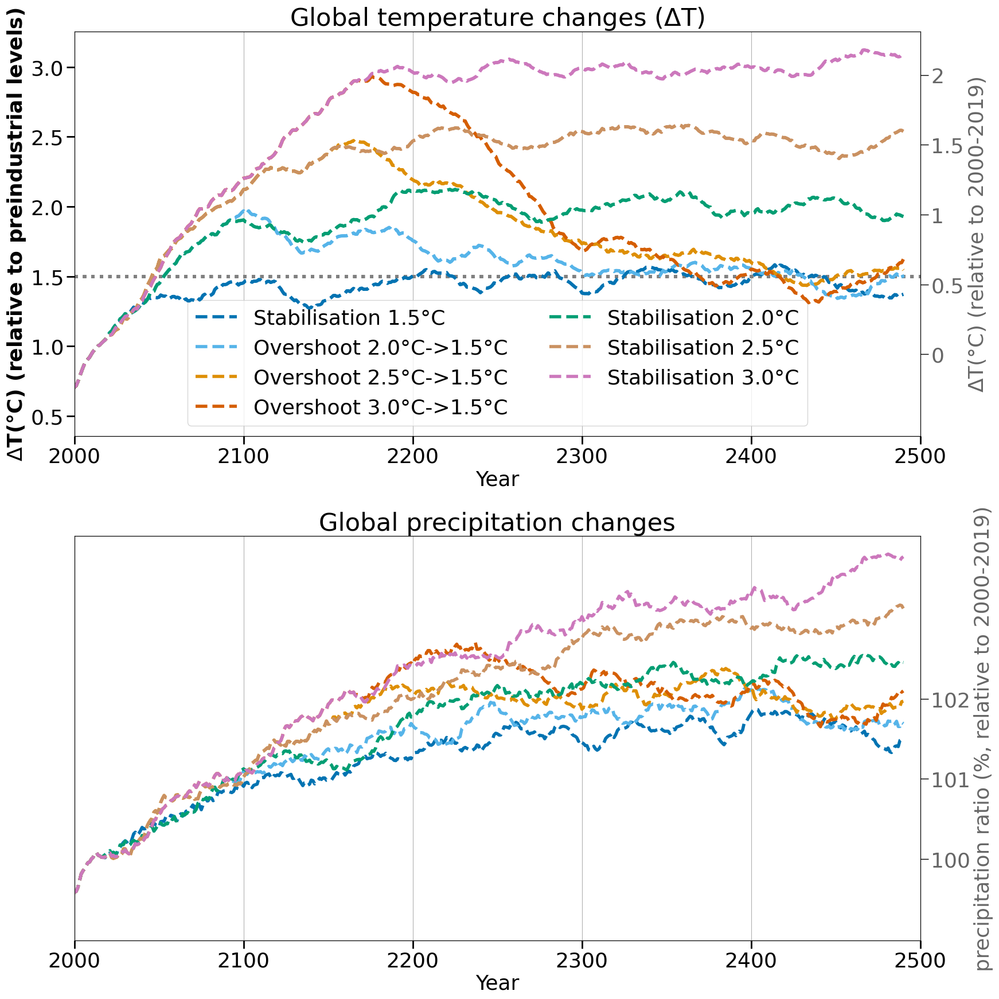

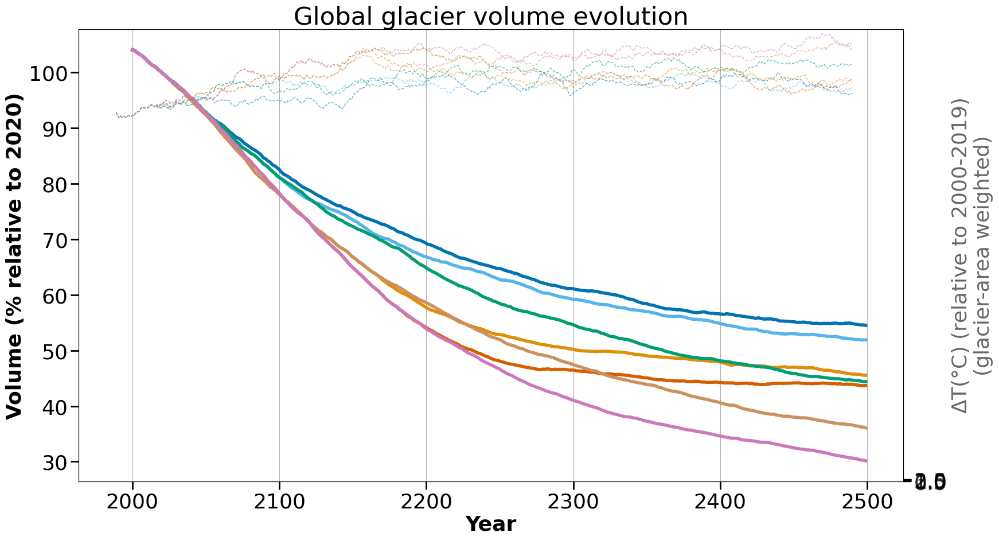

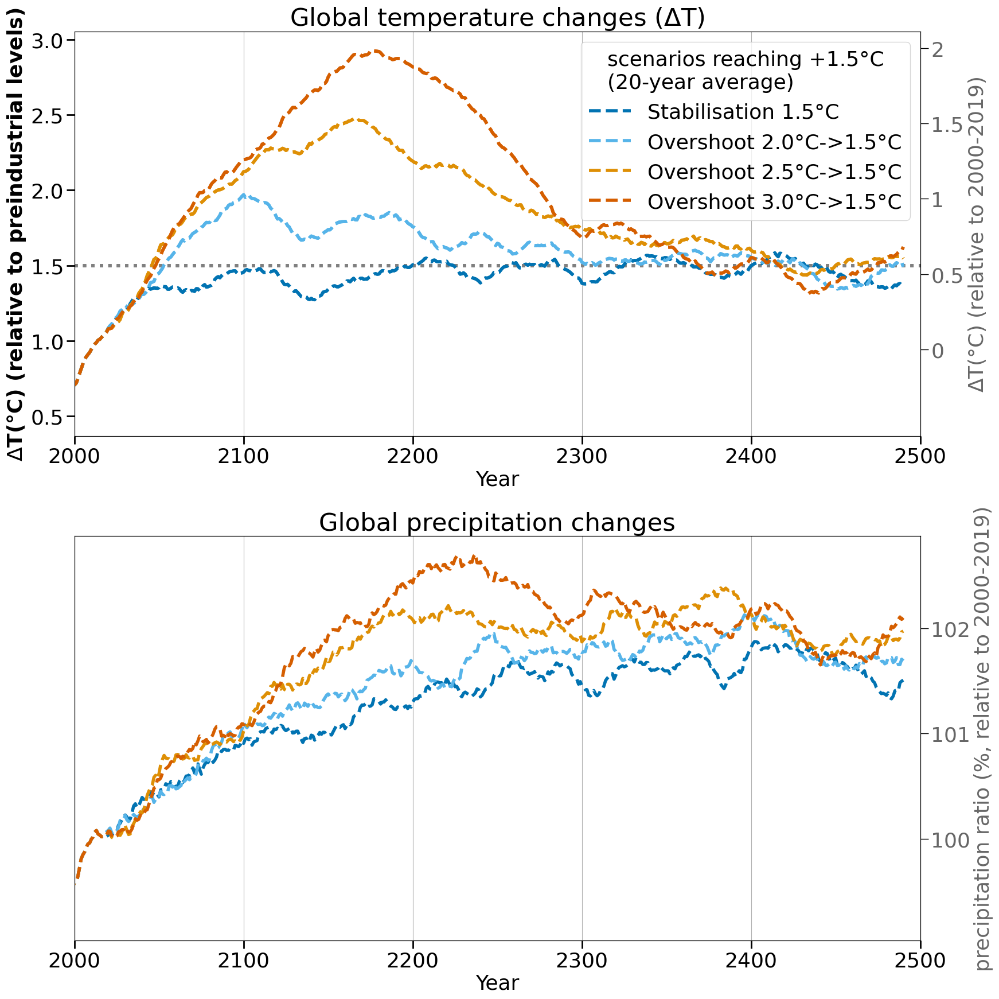

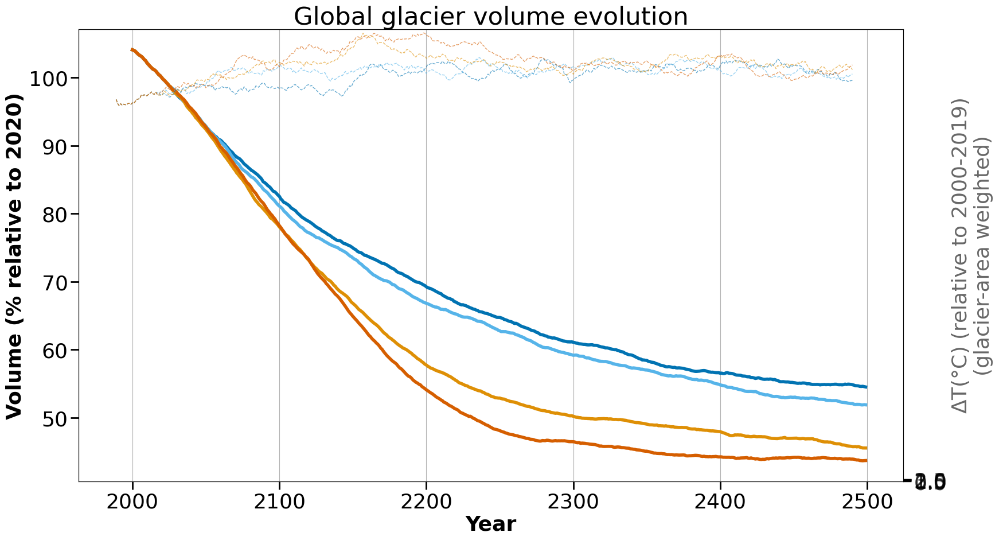

In [26]:
plt.rc('font', size=26)
for a,scenarios in zip(['_all',''],[color_scenario.keys(),
                  ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']]):
    fig, axs = plt.subplots(2,1, figsize=(18,18))

        
    for j, var in enumerate(['temp_20yr_avg','precip_20yr_avg']):

        #####################
        ax = axs[j]
        for scenario in scenarios:
                        #'stab_T30']:

            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            pd_clim_scenario_g_ref = pd_clim_scenario_g.loc[1986:2005]['temp'].mean()
            if var == 'temp_20yr_avg':
                var_g_to_ref = pd_clim_scenario_g[var]- pd_clim_scenario_g_ref + 0.63
                #var_g_to_ref = pd_clim_scenario_g[var]/precip_ref_g
                ax.plot(pd_clim_scenario_g.year,
                         var_g_to_ref, ls = '--',
                         lw=4, color = color_scenario[scenario], label=label_scenario[scenario])
                ax.set_xlabel('Year')
                ax.set_title(scenario)
                ax.axhline(1.5, color = 'grey', lw = 4, ls = ':')
            else:
                ax.set_yticks([],[])

        ax2 = ax.twinx()    
        for scenario in scenarios:
                        #'stab_T30']:

            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
            if var == 'temp_20yr_avg':
                var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
            else:
                var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g
            ax2.plot(pd_clim_scenario_g.year,
                     var_g_to_ref, ls = '--',
                     lw=4, color = color_scenario[scenario], label=label_scenario[scenario])
            #ax.axhline(1.5, color = 'grey', lw = 3, ls = '--')
        if var == 'temp_20yr_avg':
            ax2.set_yticks(ticks=[0,0.5,1,1.5,2],
                           labels=[0,0.5,1,1.5,2], alpha=0.6)   
        else:
            ax2.set_yticks(ticks=[100, 101, 102],
                           labels=[100, 101, 102], alpha=0.6)   
        ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)

        handles, labels = ax.get_legend_handles_labels()
        if a=='':
            ncol=1
            leg = ax.legend(handles[:len(scenarios)], labels[:len(scenarios)], title='scenarios reaching +1.5°C\n(20-year average)', ncol=ncol)

        else:
            ncol=2
            leg = ax.legend(handles[:len(scenarios)], labels[:len(scenarios)],ncol=ncol)
        if var != 'temp_20yr_avg':
            leg.remove()
        #ax.grid()
        ax.set_xlabel('Year')
        if var == 'temp_20yr_avg':
            ax.set_ylabel(r'$\Delta$T'+'(°C) (relative to preindustrial levels)', weight='bold')
            ax2.set_ylabel(r'$\Delta$T'+'(°C) (relative to 2000-2019)', alpha =0.6)
            ax.set_title(r'Global temperature changes ($\Delta$T)')
        else:
            #ax.set_ylabel(r'precipitation ratio (relative to preindustrial levels)', weight='bold')
            ax2.set_ylabel(r'precipitation ratio (%, relative to 2000-2019)', alpha =0.6)
            ax.set_title(r'Global precipitation changes')
        plt.tight_layout()
        plt.xlim([2000,2500])
        ax.grid(axis='x')
        ax.tick_params(axis='both', which='major', width=2, length=10)

        #plt.savefig(f'over_stab_temp_glob_reg_{basin}.pdf')
        #plt.savefig(f'over_stab_temp_glob_reg_{basin}.png')
    plt.tight_layout()
    plt.savefig(f'global_clim{a}.pdf')
    #####
    fig, axs = plt.subplots(1,1, figsize=(18,10), sharex=True)
    ax = axs
    ax.set_title('Global glacier volume evolution')
    df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_rgi_reg_common_running_glaciers.nc')
    pd_vol_scenario_rel = (100*df_scenario/df_scenario.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
    df_scenario_glob = df_scenario.sum(dim='rgi_reg')
    pd_vol_scenario_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()

    ax.set_ylabel('Volume (% relative to 2020)', weight='bold')

    sns.lineplot(data=pd_vol_scenario_glob.loc[pd_vol_scenario_glob.bias_correction=='bc_2000_2019'],
                 hue='scenario', x='time', y= 'volume_rel_2020_%', 
                 palette=list(color_scenario.values())[:len(scenarios)],
                 hue_order=scenarios,lw=4, legend=False,
                 ax = ax)
    ax.set_xlabel('Year',  weight='bold')
    ax.tick_params(axis='both', which='major', width=2, length=10)
    ax.grid(axis='x')

    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    ax2.set_yticks(ticks=[0.0,0.5,1.0,1.5,2.0,2.5,3.0],
                   labels=[0.0,0.5,1.0,1.5,2.0,2.5,3.0], alpha=0.6)
    #ax2.set_ylim([-0.9,5.9]);
    ax2.set_ylabel(r'$\Delta$T'+'(°C) (relative to 2000-2019)\n(glacier-area weighted)', alpha =0.6);
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    #plt.ylim([-2,122]);
    plt.tight_layout()
    plt.savefig(f'global_glacier_test{a}.pdf')

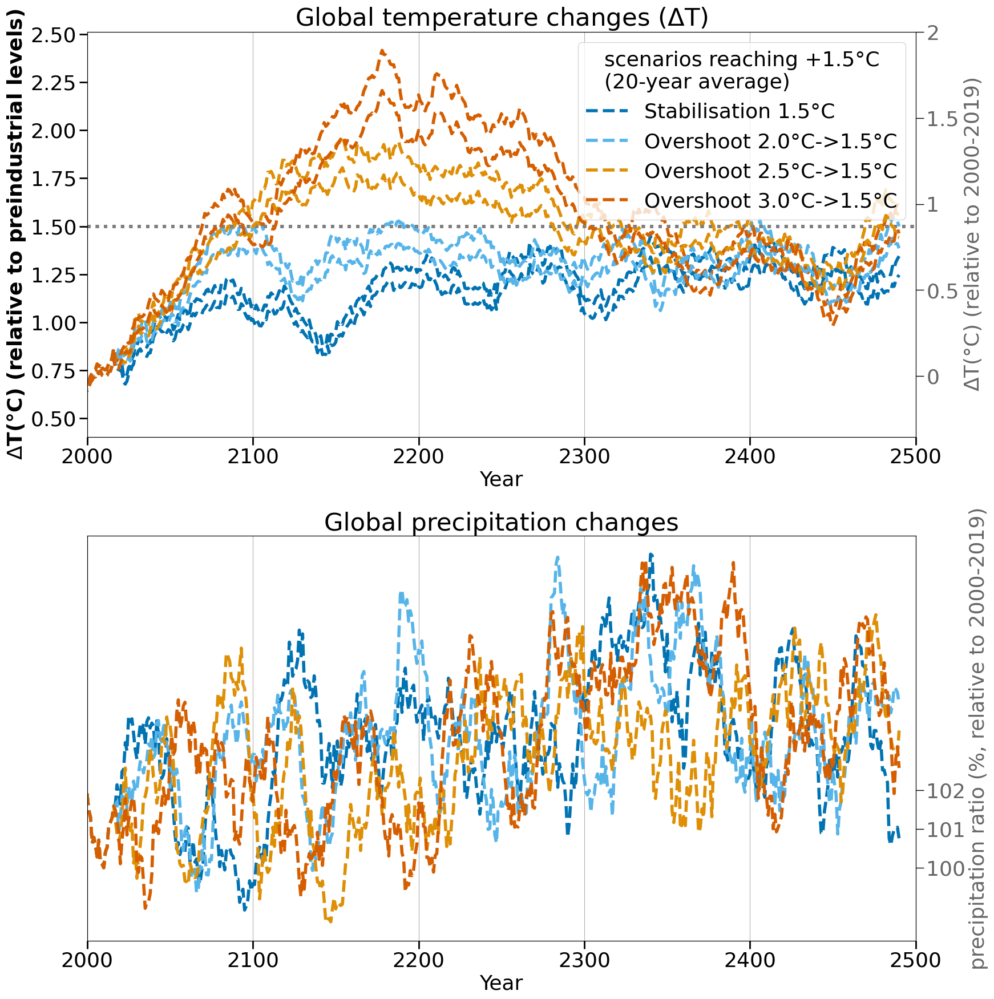

In [8]:
plt.rc('font', size=26)
fig, axs = plt.subplots(2,1, figsize=(18,18))
for j, var in enumerate(['temp_20yr_avg','precip_20yr_avg']):

    #####################
    ax = axs[j]
    for scenario in ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'provide_reg_P11_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        pd_clim_scenario_g_ref = pd_clim_scenario_g.loc[1986:2005]['temp'].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var]- pd_clim_scenario_g_ref + 0.63
            #var_g_to_ref = pd_clim_scenario_g[var]/precip_ref_g
            ax.plot(pd_clim_scenario_g.year,
                     var_g_to_ref, ls = '--',
                     lw=4, color = color_scenario[scenario], label=label_scenario[scenario])
            ax.set_xlabel('Year')
            ax.set_title(scenario)
            ax.axhline(1.5, color = 'grey', lw = 4, ls = ':')
        else:
            ax.set_yticks([],[])

    ax2 = ax.twinx()    
    for scenario in ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'provide_reg_P11_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g
        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref, ls = '--',
                 lw=4, color = color_scenario[scenario], label=label_scenario[scenario])
        #ax.axhline(1.5, color = 'grey', lw = 3, ls = '--')
    if var == 'temp_20yr_avg':
        ax2.set_yticks(ticks=[0,0.5,1,1.5,2],
                       labels=[0,0.5,1,1.5,2], alpha=0.6)   
    else:
        ax2.set_yticks(ticks=[100, 101, 102],
                       labels=[100, 101, 102], alpha=0.6)   
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)

    handles, labels = ax.get_legend_handles_labels()
    leg = ax.legend(handles[:5], labels[:5], title='scenarios reaching +1.5°C\n(20-year average)')
    if var != 'temp_20yr_avg':
        leg.remove()
    #ax.grid()
    ax.set_xlabel('Year')
    if var == 'temp_20yr_avg':
        ax.set_ylabel(r'$\Delta$T'+'(°C) (relative to preindustrial levels)', weight='bold')
        ax2.set_ylabel(r'$\Delta$T'+'(°C) (relative to 2000-2019)', alpha =0.6)
        ax.set_title(r'Global temperature changes ($\Delta$T)')
    else:
        #ax.set_ylabel(r'precipitation ratio (relative to preindustrial levels)', weight='bold')
        ax2.set_ylabel(r'precipitation ratio (%, relative to 2000-2019)', alpha =0.6)
        ax.set_title(r'Global precipitation changes')
    plt.tight_layout()
    plt.xlim([2000,2500])
    ax.grid(axis='x')
    ax.tick_params(axis='both', which='major', width=2, length=10)

In [27]:
d_reg_num_name = {}
d_reg_num_name['01'] = 'Alaska'
d_reg_num_name['02'] = 'Western Canada & USA'
d_reg_num_name['03'] = 'Arctic Canada North'
d_reg_num_name['04'] = 'Arctic Canada South'
d_reg_num_name['05'] = 'Greenland'
d_reg_num_name['06'] = 'Iceland'
d_reg_num_name['07'] = 'Svalbard and Jan Mayen'
d_reg_num_name['08'] = 'Scandinavia'
d_reg_num_name['09'] = 'Russian Arctic'
d_reg_num_name['10'] = 'North Asia'
d_reg_num_name['11'] = 'Central Europe'
d_reg_num_name['12'] = 'Caucasus and Middle East'
d_reg_num_name['13'] = 'Central Asia'
d_reg_num_name['14'] = 'South Asia West'
d_reg_num_name['15'] = 'South Asia East'
d_reg_num_name['16'] = 'Low Latitudes'
d_reg_num_name['17'] = 'Southern Andes'
d_reg_num_name['18'] = 'New Zealand'
d_reg_num_name['19'] = 'Antarctic and Subantarctic'

In [28]:
import geopandas as gpd
pd_provide_reg_full_name = gpd.read_file('/home/www/lschuster/provide/provide_glacier_regions/provide_glacier_regions.shp')
pd_provide_reg_full_name.index = pd_provide_reg_full_name.provide_id
provide_reg_full_name_dict = dict(pd_provide_reg_full_name['full_name'])
provide_reg_full_name_dict['P06'] = 'East Asia'
provide_reg_full_name_dict['P05'] = 'Svalbard, Jan Mayen\nand Russian Arctic'
provide_reg_full_name_dict['P13'] = 'Subantarctic and\nAntarctic Islands'

In [29]:
# they should be approximately equal ... 
# they are not perfectly equal -> need to find out why ...
df_scenario_r = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_provide_reg_common_running_glaciers.nc').sum(dim='provide_region')
df_scenario_p = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_rgi_reg_common_running_glaciers.nc').sum(dim='rgi_reg')
np.testing.assert_allclose(df_scenario_p.volume.sel(bias_correction='bc_2000_2019'),
df_scenario_r.volume.squeeze(), rtol=0.01)

In [100]:
df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_provide_reg_common_running_glaciers.nc')


In [117]:
df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_rgi_reg_common_running_glaciers.nc')
df_scenario

<xarray.Dataset>
Dimensions:          (time: 500, rgi_reg: 19, scenario: 7, bias_correction: 2)
Coordinates:
  * time             (time) float64 2e+03 2.001e+03 ... 2.498e+03 2.499e+03
    hydro_year       (time) int64 ...
    hydro_month      (rgi_reg, time) int64 ...
    calendar_year    (time) int64 ...
    calendar_month   (time) int64 ...
  * rgi_reg          (rgi_reg) object '14' '13' '01' '02' ... '07' '09' '06'
  * scenario         (scenario) object 'stab_T15' ... 'stab_T30'
  * bias_correction  (bias_correction) object 'bc_1980_2019' 'bc_2000_2019'
Data variables:
    volume           (bias_correction, scenario, rgi_reg, time) float32 ...

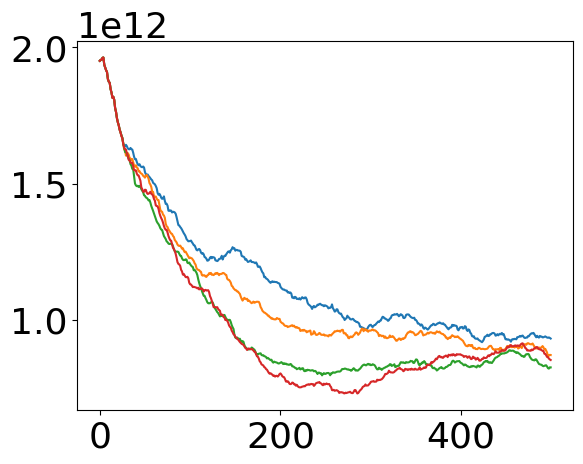

In [130]:
plt.figure()
plt.plot(df_scenario.sel(rgi_reg='17').volume.squeeze().T.sel(bias_correction='bc_2000_2019').sel(scenario=scenarios));

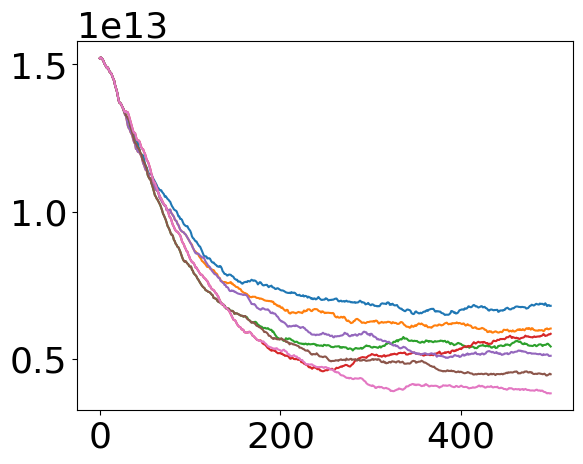

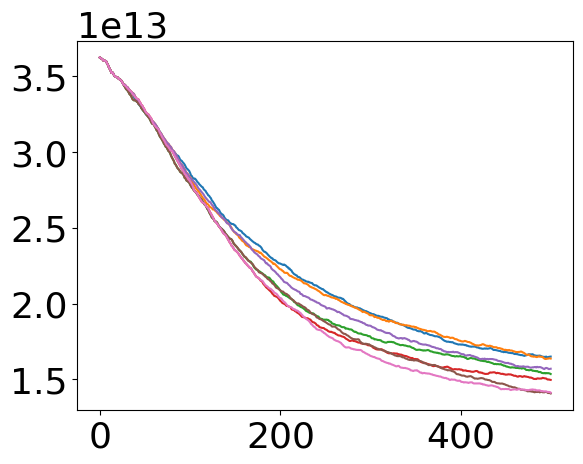

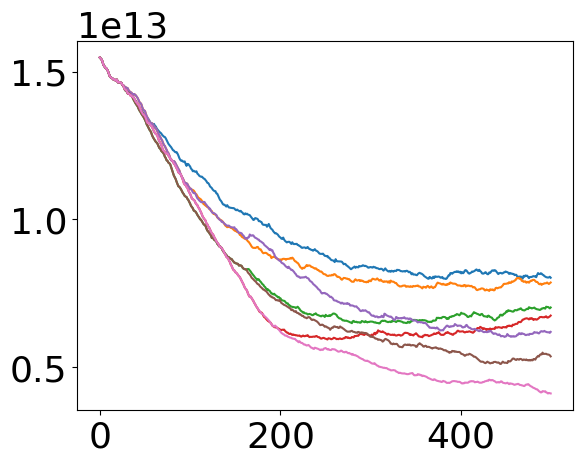

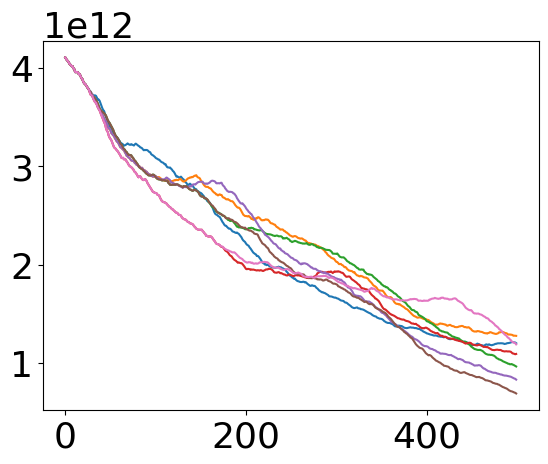

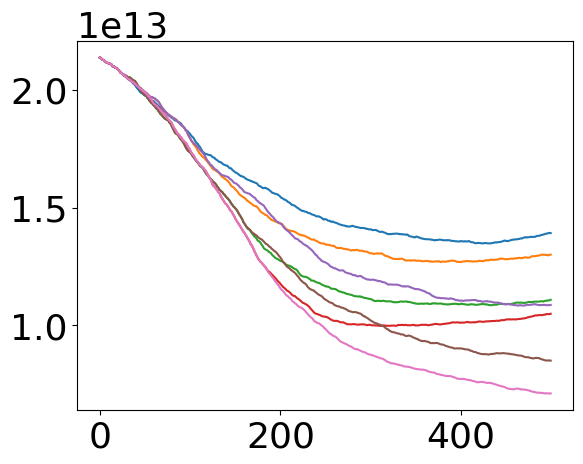

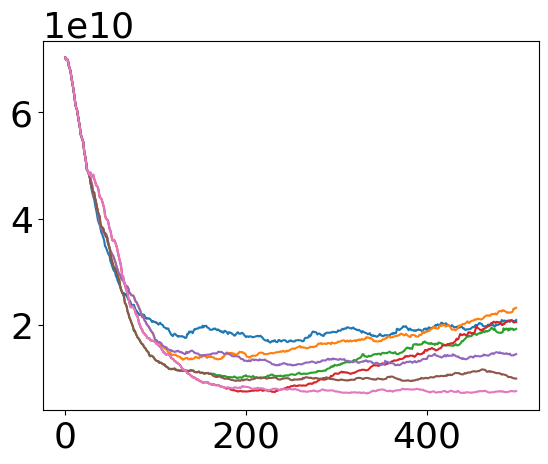

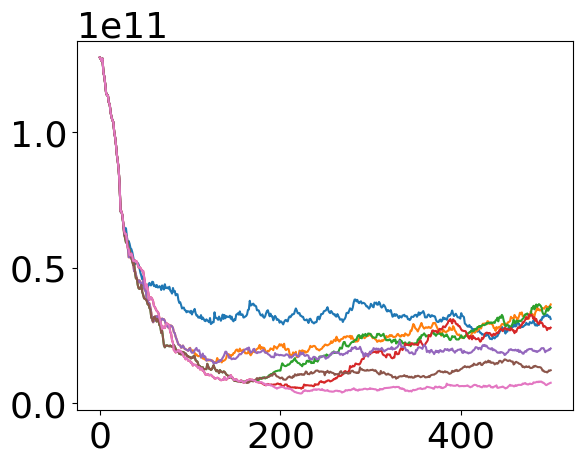

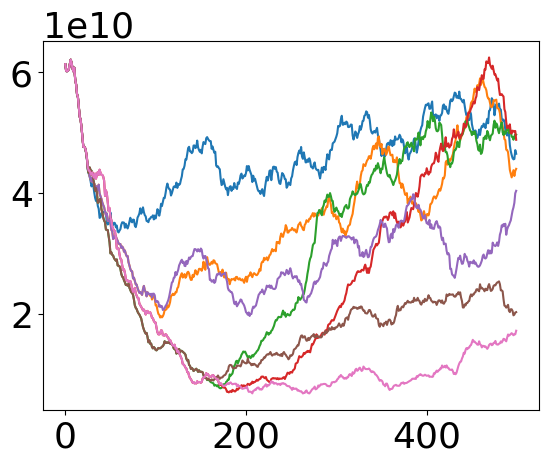

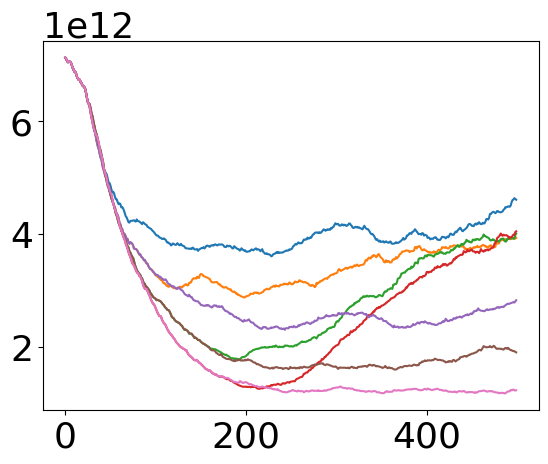

In [115]:
for k in np.arange(1,10,1):
    plt.figure()
    plt.plot(df_scenario.sel(provide_region=f'P0{k}').volume.squeeze().T);

In [32]:
scenarios = ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']

/tmp/ipykernel_3410906/1097170346.py:19: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.lineplot(data=pd_vol_scenario_glob.loc[pd_vol_scenario_glob.bias_correction=='bc_2000_2019'],
/tmp/ipykernel_3410906/1097170346.py:89: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_2000_2019'],
/tmp/ipykernel_3410906/1097170346.py:89: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_2000_2019'],
/tmp/ipykernel_3410906/1097170346.py:89: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_2000_2019'],
/tmp/ipykernel_3410906/1097170346.py:89: U

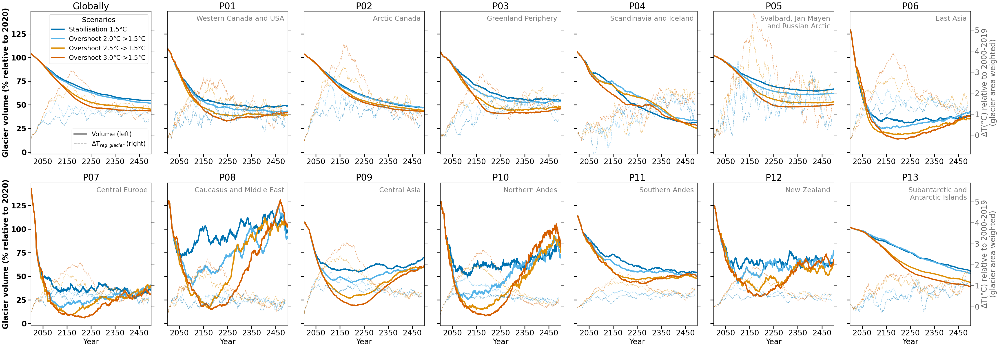

In [33]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)
df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_provide_reg_common_running_glaciers.nc')

pd_vol_scenario_rel = (100*df_scenario/df_scenario.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
df_scenario_glob = df_scenario.sum(dim='provide_region')
pd_vol_scenario_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()

plt.figure(figsize=(45,16)) #, sharey=True, sharex=True)
plt.subplot(2,7,1)
ax = plt.gca()
ax.set_title('Globally')

ax.set_ylabel('Glacier volume (% relative to 2020)', weight='bold')
scenarios = ['stab_T15', 'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']
sns.lineplot(data=pd_vol_scenario_glob.loc[pd_vol_scenario_glob.bias_correction=='bc_2000_2019'],
             hue='scenario', x='time', y= 'volume_rel_2020_%', 
             palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_ylim([-2,149]);
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in ['stab_T15',
                 'oversh_T20OS15',
                 'oversh_T25OS15',
                 'oversh_T30OS15']:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 0.6, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
ax2.set_ylim([-0.9,5.9]);

plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])

### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:5], labels_2[:5], title='Scenarios', fontsize=20, title_fontsize=22)
for l in leg.get_lines():
    l.set_linewidth(4)
leg2 = ax.legend([handles[0], handles_2[0]], ['Volume (left)', r'$\Delta$T$_{reg,glacier}$ '+'(right)'], loc='lower right', ncol=1, fontsize=20)
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('grey')
ax.add_artist(leg)


for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(2,7,j+2)
    ax = plt.gca()
    pd_vol_scenario_rel_reg = pd_vol_scenario_rel.loc[pd_vol_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_2000_2019'],
                 hue='scenario', x='time', y= 'volume_rel_2020_%', 
                 palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
    
    ax.set_title(f'{Preg}')
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)
    ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    if j in [6]:
        plt.ylabel(f'Glacier volume (% relative to 2020)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    ax.set_ylim([-2,149]);
    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
    if j in [5,12]:
        ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    ax2.set_ylim([-0.9,5.9]);
    if j >5:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)  

plt.tight_layout()
#plt.savefig('test_provide_reg.png', dpi=450) #, bbox_inches='tight')
plt.savefig('overshoot_provide_reg.pdf')

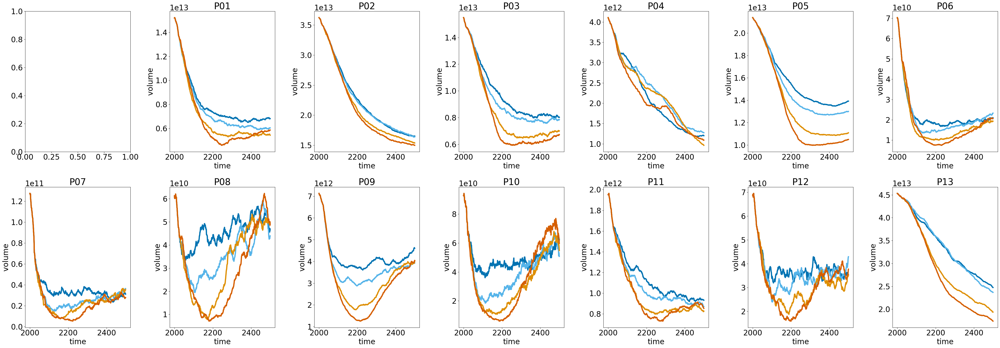

In [17]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)
df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_provide_reg_common_running_glaciers.nc')


plt.figure(figsize=(45,16)) #, sharey=True, sharex=True)
plt.subplot(2,7,1)



for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(2,7,j+2)
    ax = plt.gca()
    pd_vol_scenario_rel_reg = df_scenario.sel(provide_region=Preg).volume.to_dataframe('volume').reset_index()
    sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_2000_2019'],
                 hue='scenario', x='time', y= 'volume', 
                 palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
    
    ax.set_title(f'{Preg}')


plt.tight_layout()
#plt.savefig('test_provide_reg.png', dpi=450) #, bbox_inches='tight')
#plt.savefig('overshoot_provide_reg.pdf')

/tmp/ipykernel_3410906/112030068.py:20: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.lineplot(data=pd_runoff_scenario_rel_glob,
/tmp/ipykernel_3410906/112030068.py:75: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction=='bc_2000_2019'],
/tmp/ipykernel_3410906/112030068.py:75: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction=='bc_2000_2019'],
/tmp/ipykernel_3410906/112030068.py:75: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction=='bc_2000_2019'],
/tmp/ipykernel_3410906/112030068.py:75: UserWarning: The palette list has more 

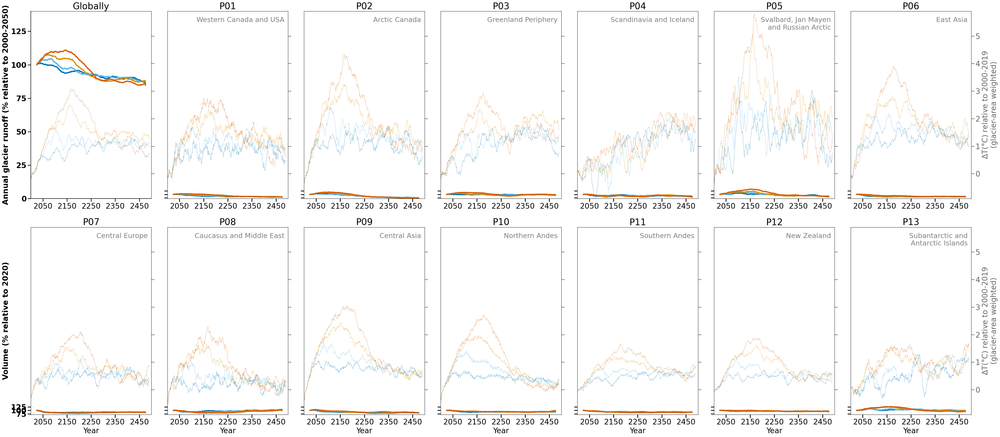

In [34]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)
df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_provide_reg_common_running_glaciers.nc')
df_scenario['runoff_50_yr_avg'] = df_scenario.runoff.rolling(min_periods=50, time=50, center=True).mean()
df_scenario_glob = df_scenario.sum(dim='provide_region', min_count=13)
pd_runoff_scenario_rel = (100*df_scenario/df_scenario.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()
pd_runoff_scenario_rel_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()


plt.figure(figsize=(45,20)) #, sharey=True, sharex=True)
plt.subplot(2,7,1)
ax = plt.gca()
ax.set_title('Globally')

ax.set_ylabel('Annual glacier runoff (% relative to 2000-2050)', weight='bold')
scenarios = ['stab_T15', 'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']
sns.lineplot(data=pd_runoff_scenario_rel_glob,
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
             palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_ylim([70,140]);
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in ['stab_T15',
                 'oversh_T20OS15',
                 'oversh_T25OS15',
                 'oversh_T30OS15']:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 0.6, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
ax2.set_ylim([-0.9,5.9]);

plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])

for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(2,7,j+2)
    ax = plt.gca()
    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction=='bc_2000_2019'],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
    
    ax.set_title(f'{Preg}')
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    if j in [6]:
        plt.ylabel(f'Volume (% relative to 2020)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    ax.set_ylim([70,1439.9]);

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
    if j in [5,12]:
        ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    ax2.set_ylim([-0.9,5.9]);
    if j >5:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
plt.tight_layout()
plt.savefig('test_provide_reg_runoff.pdf')

# Only selected provide regions

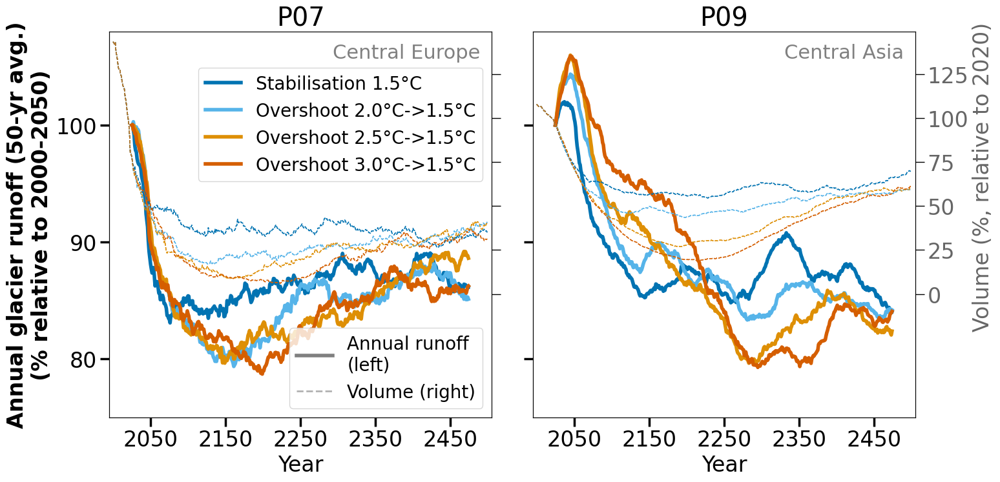

In [124]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)
df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_provide_reg_common_running_glaciers.nc')
df_scenario['runoff_50_yr_avg'] = df_scenario.runoff.isel(time=slice(0,-1)).rolling(min_periods=50, time=50, center=True).mean()
df_scenario_glob = df_scenario.sum(dim='provide_region', min_count=13)
pd_runoff_scenario_rel = (100*df_scenario/df_scenario.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()
pd_runoff_scenario_rel_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()


plt.figure(figsize=(16,8)) #, sharey=True, sharex=True)

for j, Preg in enumerate(['P07', 'P09']):
    plt.subplot(1,2,j+1)
    ax = plt.gca()
    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction=='bc_2000_2019'],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
    
    ax.set_title(f'{Preg}')
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    plt.ylabel(f'Annual glacier runoff (50-yr avg.)\n(% relative to 2000-2050)', weight='bold')
    ax.set_yticks(np.arange(70,125,10), weight='bold')
   

    ax.set_ylim([75,108]);

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    
    #####################
    ax2 = ax.twinx()  
    for scenario in ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']:
                    #'stab_T30']:
        pd_vol_scenario_rel_reg = pd_vol_scenario_rel.loc[pd_vol_scenario_rel.provide_region==Preg]
        sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_2000_2019'],
                     hue='scenario', x='time', y= 'volume_rel_2020_%', 
                     palette=list(color_scenario.values())[:-1],
                 hue_order=scenarios, legend=True,
                 ax = ax2, lw=1, alpha = 0.6, ls='--')
        

    

        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    

    ax2.set_ylim([-70,149]);
    ax2.set_yticks([0,25,50,75,100], [0,25,50,75,100])
    ax.set_xlabel('Year')

    ax.set_xlim([1995,2505])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([1995,2505])
    ax2.set_yticks(ticks=[0,25,50,75,100,125],
               labels=[0,25,50,75,100,125], alpha=0.6)
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    
    if j ==1:
        ax2.set_ylabel(f'              Volume (%, relative to 2020)',
                      alpha = 0.6)
        ax.set_ylabel('')
        plt.setp(ax.get_yticklabels(), visible=False, fontsize=1)
    else:
        ax2.set_ylabel('')
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
        ax.set_ylabel(f'Annual glacier runoff (50-yr avg.)\n(% relative to 2000-2050)', weight='bold')
        
        
    if j ==0:
        ### add legends
        handles, labels = ax.get_legend_handles_labels()
        ax.get_legend().remove()
        # we take label_2 and handles_2 from the plots above
        #handles_2, _ = ax2.get_legend_handles_labels()
        ax2.get_legend().remove()
        leg = ax.legend(handles[:5], labels_2[:5], fontsize=20, loc = 'upper right', bbox_to_anchor=(1,0.93))
        for l in leg.get_lines():
            l.set_linewidth(4)
            
        leg2 = ax.legend([handles[0], handles_2[0]],
                  ['Annual runoff\n(left)', 'Volume '+'(right)'], loc='lower right', fontsize=20, ncol=1)
        leg2.get_lines()[0].set_linewidth(4)
        leg2.get_lines()[1].set_linewidth(2)
        for l in leg2.get_lines():
            l.set_color('grey')
        ax.add_artist(leg)
    else:
        ax.get_legend().remove()
        ax2.get_legend().remove()

plt.tight_layout()
plt.savefig('test_provide_reg_runoff_select_vol.pdf')

## Some tests

**some local climate tests**

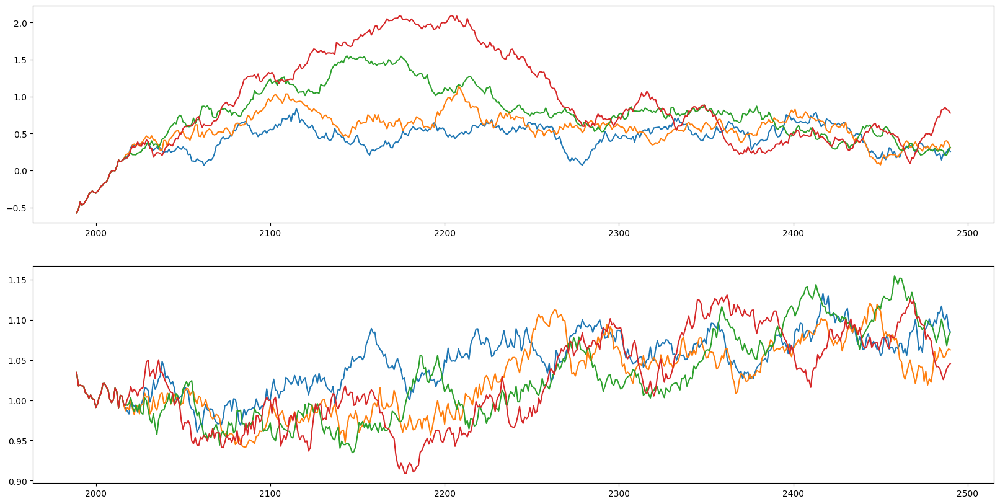

In [9]:
lon_aletsch, lat_aletsch = odf.loc['RGI60-11.01450'][['CenLon', 'CenLat']]
# just open any file to check the format
path = '../'
with xr.open_mfdataset(path + '/oversh_T20OS15/' + 'atmos_month_20*.nc') as ds_ref:
    ds = ds_ref.sel(lon=lon_aletsch, lat=lat_aletsch, method='nearest').load()
# flattening file test was done at the beginning of notebook
dg_tas_aletsch = xr.open_dataset(f'{path}/oversh_T20OS15/scenario_tas_annual.nc').sel(lon=lon_aletsch, lat=lat_aletsch, method='nearest')
# dg_pr = xr.open_dataset(f'{path}/oversh_T20OS15/scenario_p.nc')
np.testing.assert_allclose(dg_tas_aletsch.sel(year=slice(2000,2099)).t_ref,
                           ds.t_ref.load().groupby('time.year').mean(), rtol=1e-5)

basin = 'RHONE'
import geopandas as gpd
pd_basin_num = gpd.read_file('/home/www/fmaussion/misc/magicc/basins_shape/glacier_basins.shp')
basin_idx = pd_basin_num[pd_basin_num['RIVER_BASI'] == basin]['MRBID'].values[0]

pd_clim_all = pd.read_csv('../annual_glob_rgi_reg_basin_temp_precip_timeseries_oversh_stab.csv', index_col = 'Unnamed: 0')
clim_rgi_11 = pd_clim_all.loc[pd_clim_all.region == 'RGI11_glacier']
clim_basin_rhone = pd_clim_all.loc[pd_clim_all.region == f'basin_{basin_idx}_glacier']  # this is 
scenarios = ['stab_T15', 'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']
fig, axs = plt.subplots(2,1, figsize=(20,10))
for scenario in scenarios:
    dg_tas_aletsch = xr.open_dataset(f'{path}/{scenario}/scenario_tas_annual.nc').sel(lon=lon_aletsch, lat=lat_aletsch, method='nearest')
    dg_precip_aletsch = xr.open_dataset(f'{path}/{scenario}/scenario_precip_annual.nc').sel(lon=lon_aletsch, lat=lat_aletsch, method='nearest')

    np.testing.assert_allclose(clim_rgi_11.loc[clim_rgi_11.scenario == scenario]['temp'].values,
                               dg_tas_aletsch.t_ref, rtol = 0.01)
    np.testing.assert_allclose(clim_basin_rhone.loc[clim_basin_rhone.scenario==scenario]['temp'].values,
                                dg_tas_aletsch.t_ref, rtol = 0.01)
    
    np.testing.assert_allclose(clim_rgi_11.loc[clim_rgi_11.scenario == scenario]['precip'].values,
                               dg_precip_aletsch.precip, rtol = 0.25) # more precip variability
    np.testing.assert_allclose(clim_basin_rhone.loc[clim_basin_rhone.scenario==scenario]['precip'].values,
                                dg_precip_aletsch.precip, rtol = 0.25) # more precip variability
    
    assert np.corrcoef(clim_rgi_11.loc[clim_rgi_11.scenario==scenario]['precip'].values,
                                dg_precip_aletsch.precip)[0][1] > 0.90
    assert np.corrcoef(clim_basin_rhone.loc[clim_basin_rhone.scenario==scenario]['precip'].values,
                                dg_precip_aletsch.precip)[0][1] > 0.90
    
    delta_t_aletsch = dg_tas_aletsch.t_ref -dg_tas_aletsch.t_ref.sel(year=slice(2000,2019)).mean()
    # do a visual check with the poster plot 
    axs[0].plot(delta_t_aletsch.to_dataframe().rolling(20, center=True).mean()['t_ref'])                    
    ratio_prcp_aletsch = dg_precip_aletsch.precip/dg_precip_aletsch.precip.sel(year=slice(2000,2019)).mean()
    axs[1].plot(ratio_prcp_aletsch.to_dataframe().rolling(20, center=True).mean()['precip'])   
# ok, looks good!!! 


**now check volume and runoff**

In [37]:
rgi_id = 'RGI60-11.01450'
drun = xr.open_dataset('../runs/output/RGI11/run_hydro_w5e5_gcm_merged_from_2000_gfdl-esm2m_stab_T15_endyr_2500_bc_2000_2019_rgi11_1000_2000.nc')
drun_aletsch = drun.sel(rgi_id=rgi_id)

In [70]:
# period of geodetic mass balance
ref_period ='2000-01-01_2020-01-01'

# open the observation with uncertainty
df_ref_dmdtda = utils.get_geodetic_mb_dataframe().loc[rgi_id]  # get the data from Hugonnet 2021
df_ref_dmdtda = df_ref_dmdtda.loc[df_ref_dmdtda['period'] == ref_period]  # only select the desired period
dmdtda_reference = df_ref_dmdtda['dmdtda'].values[0] * 1000  # get the reference dmdtda and convert into kg m-2 yr-1
dmdtda_reference_error = df_ref_dmdtda['err_dmdtda'].values[0] * 1000  # corresponding uncertainty

# calculate dynamic geodetic mass balance (adapted from Patricks spinup tutorial)
def get_dmdtda(ds):
    yr0_ref_mb, yr1_ref_mb = ref_period.split('_')
    yr0_ref_mb = int(yr0_ref_mb.split('-')[0])
    yr1_ref_mb = int(yr1_ref_mb.split('-')[0])

    return ((ds.volume.loc[yr1_ref_mb].values -
             ds.volume.loc[yr0_ref_mb].values) /
            df_ref_dmdtda.area.values /
            (yr1_ref_mb - yr0_ref_mb) *
            900) #ice density

print(f'Reference dmdtda 2000 to 2020 (Hugonnet 2021): {dmdtda_reference:.2f} +/- {dmdtda_reference_error:6.2f} kg m-2 yr-1')
print(f'Dynamic spinup dmdtda 2000 to 2020:            {float(get_dmdtda(drun_aletsch)):.2f}            kg m-2 yr-1')
#print(f"Dynamically calibrated melt_f:                 {gdir.read_json('mb_calib')['melt_f']:.1f}                 kg m-2 day-1 °C-1")
# dynamic spinup fits inside the provided observation uncertainty 

Reference dmdtda 2000 to 2020 (Hugonnet 2021): -1210.70 +/- 131.50 kg m-2 yr-1
Dynamic spinup dmdtda 2000 to 2020:            -1327.24            kg m-2 yr-1


In [55]:
pd_geodetic = utils.get_geodetic_mb_dataframe()[utils.get_geodetic_mb_dataframe().period=='2000-01-01_2020-01-01']

In [57]:
pd_geodetic.loc[rgi_id].dmdtda

-1.2107

In [63]:
(drun_aletsch.volume.sel(time=2019)-(drun_aletsch.volume.sel(time=2000)))/drun_aletsch.area.sel(time=slice(2000,2020)).mean()/20

<xarray.DataArray ()>
array(-1.38289566)
Coordinates:
    rgi_id          <U14 'RGI60-11.01450'
    hydro_month     int64 4
    calendar_month  int64 1

In [44]:
(drun_aletsch.volume.sel(time=2019)-(drun_aletsch.volume.sel(time=2000)))/pd_geodetic.loc[rgi_id].area/20

<xarray.DataArray 'volume' ()>
array(-1.37292059)
Coordinates:
    rgi_id          <U14 'RGI60-11.01450'
    hydro_month     int64 4
    calendar_month  int64 1

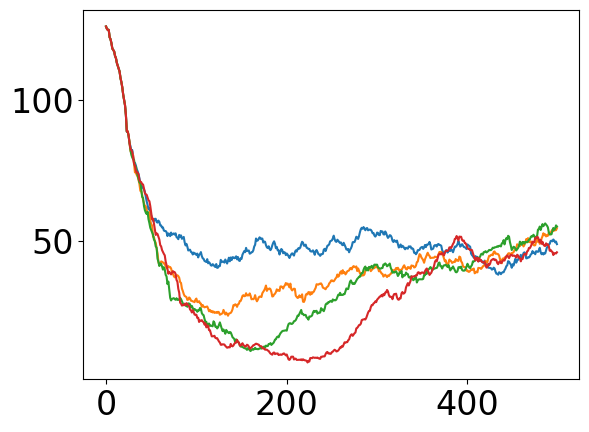

In [75]:
for scenario in scenarios:
    drun = xr.open_dataset(f'../runs/output/RGI11/run_hydro_w5e5_gcm_merged_from_2000_gfdl-esm2m_{scenario}_endyr_2500_bc_2000_2019_rgi11_1000_2000.nc')
    drun_aletsch = drun.sel(rgi_id=rgi_id)
    plt.plot(100*drun_aletsch.volume/drun_aletsch.volume.sel(time=2020))

/tmp/ipykernel_99482/3367381897.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  runoff = drun_aletsch[runoff_vars].to_dataframe().sum(axis=1)


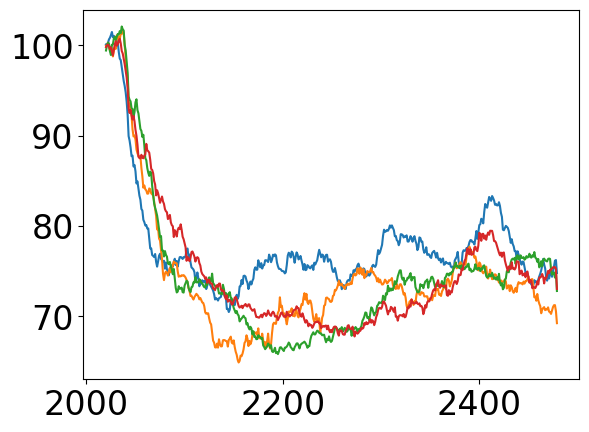

In [79]:
for scenario in scenarios:
    drun = xr.open_dataset(f'../runs/output/RGI11/run_hydro_w5e5_gcm_merged_from_2000_gfdl-esm2m_{scenario}_endyr_2500_bc_2000_2019_rgi11_1000_2000.nc')
    drun_aletsch = drun.sel(rgi_id=rgi_id)
    runoff_vars = ['melt_off_glacier', 'melt_on_glacier', 'liq_prcp_off_glacier', 'liq_prcp_on_glacier']
    runoff = drun_aletsch[runoff_vars].to_dataframe().sum(axis=1)
    runoff = runoff.rolling(41, center=True).mean()
    runoff = 100*runoff/runoff.loc[2021]
    plt.plot(runoff)

- ok the two plots look very similar to RGI11/P0

## Other older plot variants ... (not chosen for the poster) ...

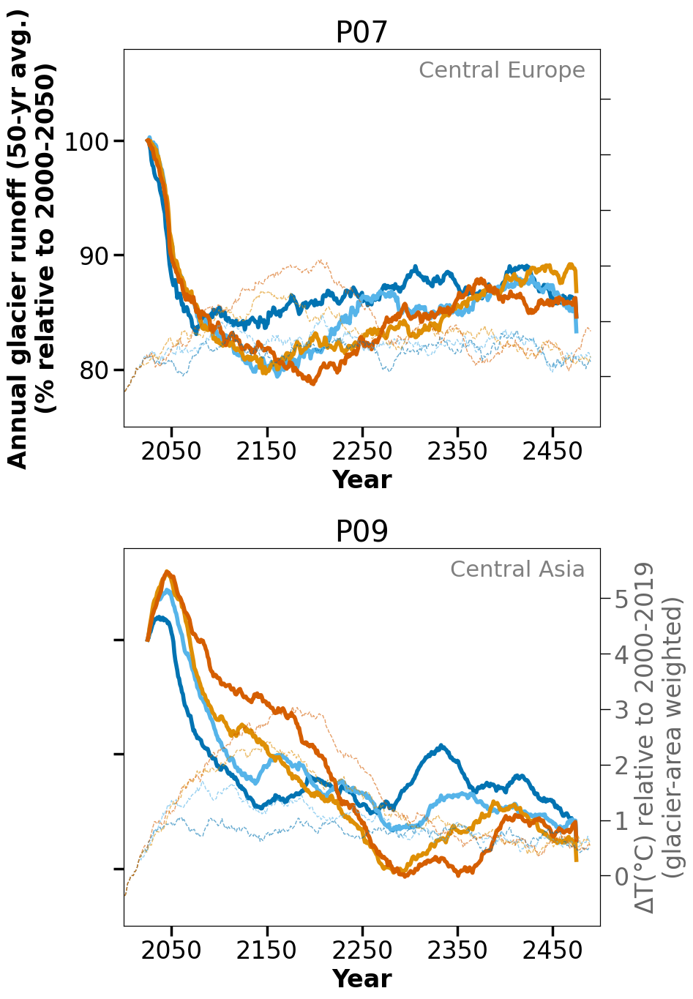

In [57]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)
df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_provide_reg_common_running_glaciers.nc')
df_scenario['runoff_50_yr_avg'] = df_scenario.runoff.rolling(min_periods=50, time=50, center=True).mean()
df_scenario_glob = df_scenario.sum(dim='provide_region', min_count=13)
pd_runoff_scenario_rel = (100*df_scenario/df_scenario.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()
pd_runoff_scenario_rel_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()


plt.figure(figsize=(10,14)) #, sharey=True, sharex=True)

for j, Preg in enumerate(['P07', 'P09']):
    plt.subplot(2,1,j+1)
    ax = plt.gca()
    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction=='bc_2000_2019'],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
    
    ax.set_title(f'{Preg}')
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    
    ax.set_yticks(np.arange(70,125,10), weight='bold')
   

    ax.set_ylim([75,108]);

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    
    #####################
    ax2 = ax.twinx()  
    for scenario in ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)

    ax2.set_ylim([-0.9,5.9]);
    ax.set_xlabel('Year', weight = 'bold')

    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    
    
plt.tight_layout()
plt.savefig('test_provide_reg_runoff_select.pdf')

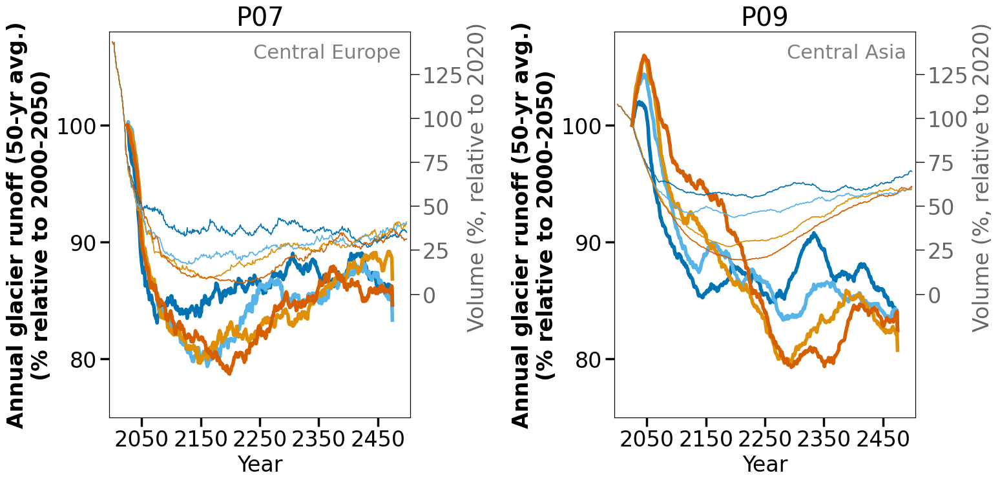

In [94]:
pd_vol_scenario_rel_reg

,bias_correction,provide_region,scenario,gcm,time,hydro_month,calendar_month,volume_rel_2020_%
28000,bc_2000_2019,P09,stab_T15,GFDL-ESM2M,2000.0,4,1,107.679283
28001,bc_2000_2019,P09,stab_T15,GFDL-ESM2M,2001.0,4,1,107.314201
28002,bc_2000_2019,P09,stab_T15,GFDL-ESM2M,2002.0,4,1,106.763153
28003,bc_2000_2019,P09,stab_T15,GFDL-ESM2M,2003.0,4,1,106.440590
28004,bc_2000_2019,P09,stab_T15,GFDL-ESM2M,2004.0,4,1,106.680389
...,...,...,...,...,...,...,...,...
31495,bc_2000_2019,P09,stab_T30,GFDL-ESM2M,2495.0,4,1,18.741167
31496,bc_2000_2019,P09,stab_T30,GFDL-ESM2M,2496.0,4,1,18.802198
31497,bc_2000_2019,P09,stab_T30,GFDL-ESM2M,2497.0,4,1,18.603451
31498,bc_2000_2019,P09,stab_T30,GFDL-ESM2M,2498.0,4,1,18.575354


In [93]:
pd_vol_scenario_rel_reg = pd_vol_scenario_rel.loc[pd_vol_scenario_rel.provide_region==Preg]
sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_2000_2019'],
             hue='scenario', x='time', y= 'volume_rel_2020_%', 
             palette=list(color_scenario.values())[:-1],
         hue_order=scenarios,lw=4, legend=False,
         ax = ax)

<AxesSubplot:title={'center':'P09'}, xlabel='Year', ylabel='Annual glacier runoff (50-yr avg.)\n(% relative to 2000-2050)'>

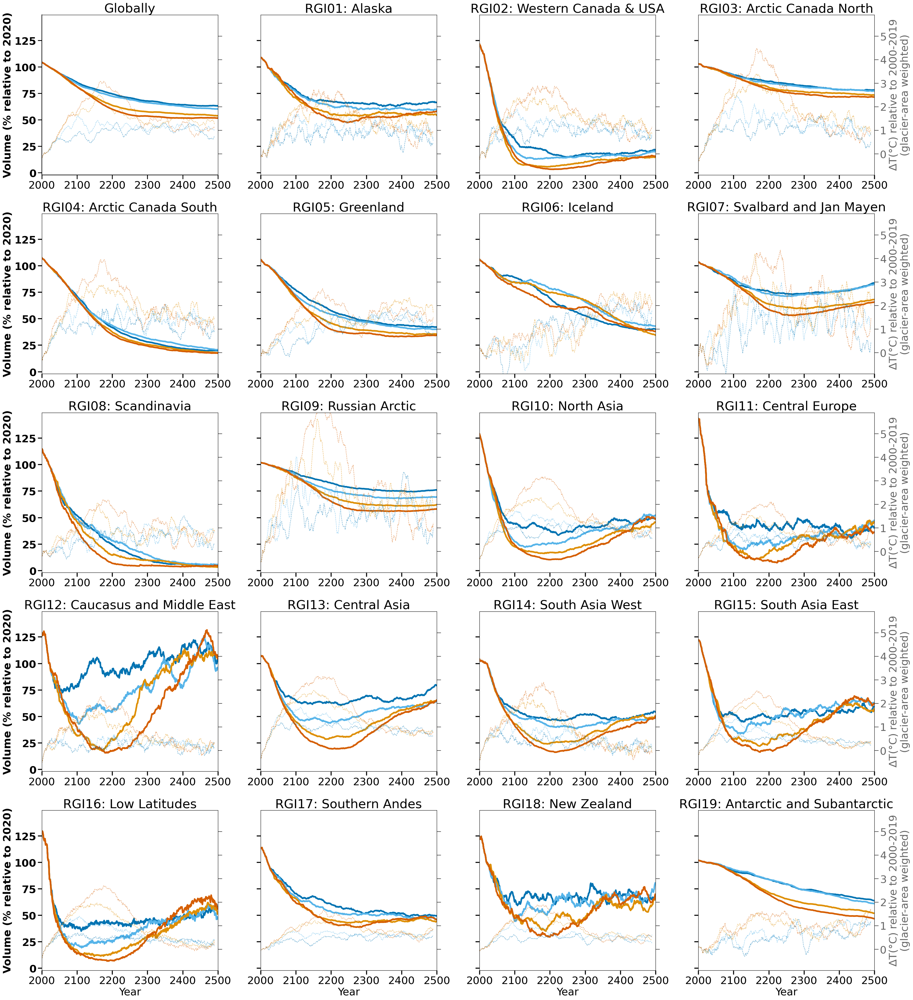

In [246]:
plt.rc('font', size=26)

df_scenario = xr.open_dataset(f'volume_evol_gfdl-esm2m_oversh_stab_rgi_reg_common_running_glaciers.nc')
pd_vol_scenario_rel = (100*df_scenario/df_scenario.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
df_scenario_glob = df_scenario.sum(dim='rgi_reg')
pd_vol_scenario_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()

plt.figure(figsize=(32,35)) #, sharey=True, sharex=True)
plt.subplot(5,4,1)
ax = plt.gca()
ax.set_title('Globally')

ax.set_ylabel('Volume (% relative to 2020)', weight='bold')
scenarios = ['stab_T15', 'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']
sns.lineplot(data=pd_vol_scenario_glob.loc[pd_vol_scenario_glob.bias_correction=='bc_1980_2019'],
             hue='scenario', x='time', y= 'volume_rel_2020_%', 
             palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_ylim([-2,149]);
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in ['stab_T15',
                 'oversh_T20OS15',
                 'oversh_T25OS15',
                 'oversh_T30OS15']:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 0.6, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
ax2.set_ylim([-0.9,5.9]);
plt.setp(ax2.get_yticklabels(), visible=False)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)

for j,rgi_reg in enumerate(d_reg_num_name.keys()):
    plt.subplot(5,4,j+2)
    ax = plt.gca()
    pd_vol_scenario_rel_reg = pd_vol_scenario_rel.loc[pd_vol_scenario_rel.rgi_reg==rgi_reg]
    sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_1980_2019'],
                 hue='scenario', x='time', y= 'volume_rel_2020_%', 
                 palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
    
    plt.title(f'RGI{rgi_reg}: {d_reg_num_name[rgi_reg]}')
    
    ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    if j in [-1,3,7,11, 15]:
        plt.ylabel(f'Volume (% relative to 2020)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    ax.set_ylim([-2,149]);
    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in ['stab_T15',
                     'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'RGI{rgi_reg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
    if j in [2,6,10,14,18]:
        ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        plt.setp(ax2.get_yticklabels(), visible=False)

    ax2.set_ylim([-0.9,5.9]);
    if j >14:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
plt.tight_layout()
plt.savefig('test.pdf')

### RUNOFF

6243

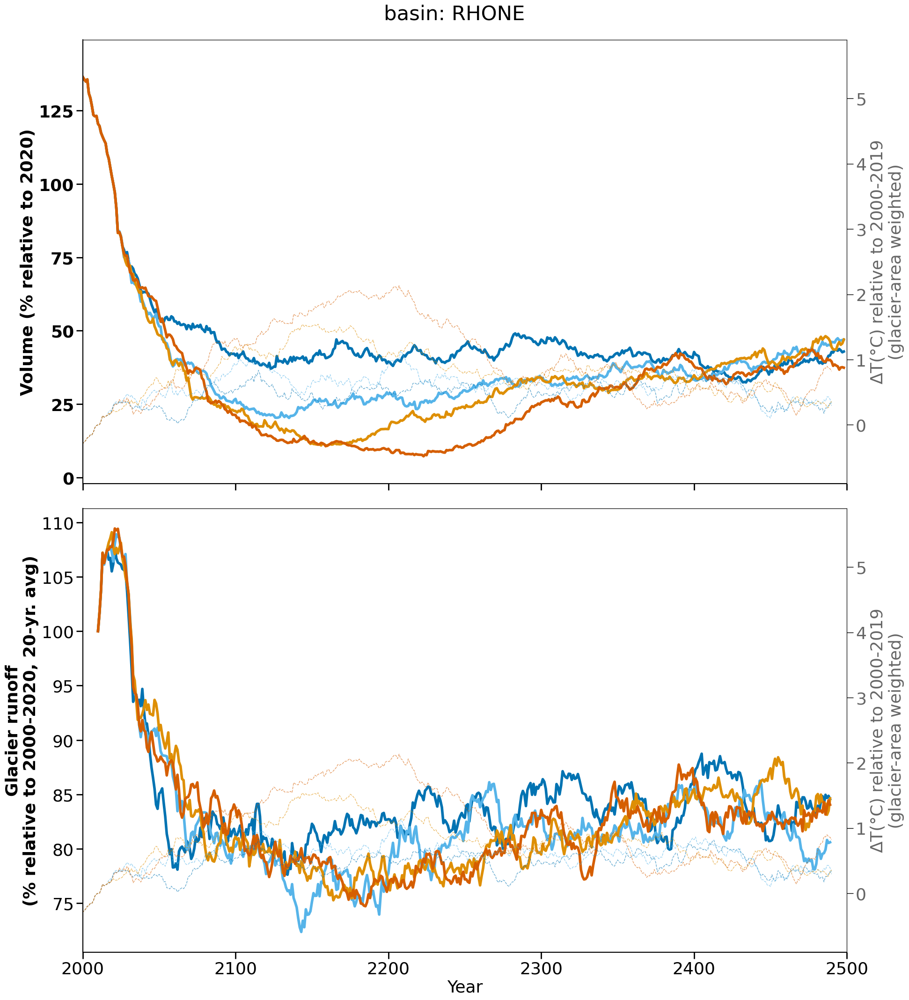

In [296]:
basin = 'RHONE'
import geopandas as gpd
pd_basin_num = gpd.read_file('/home/www/fmaussion/misc/magicc/basins_shape/glacier_basins.shp')
basin_idx = pd_basin_num[pd_basin_num['RIVER_BASI'] == basin]['MRBID'].values[0]

dir_path = '/home/www/lschuster/provide/gfdl-esm2m_oversh_stab_uni_bern/runs/output/basins/'
file = f'w5e5_gcm_merged_from_2000_bc_2000_2019/{basin_idx}/basin_{basin_idx}_run_hydro_w5e5_gcm_merged_from_2000_endyr2500_bc_2000_2019.nc'
with xr.open_dataset(dir_path+file) as dr:
    dr = dr[['runoff','volume']].load()
    dr = dr.isel(time=slice(0,-1))
    # only want common running RGIs
    dr = dr.dropna(dim='rgi_id',how='any')
    dr = dr.sum(dim='rgi_id')
dr['runoff_50_yr_avg'] = dr.runoff.rolling(min_periods=50, time=50, center=True).mean()
dr['runoff_20_yr_avg'] = dr.runoff.rolling(min_periods=20, time=20, center=True).mean()

bc = 'bc_2000_2019' #'bc_1980_2019'
plt.rc('font', size=26)

pd_vol_scenario_rel = (100*dr/dr.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
pd_runoff_scenario_rel = (100*dr/dr.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()
pd_runoff_scenario_rel_20yravg = (100*dr/dr.sel(time=2010)).runoff_20_yr_avg.to_dataframe('runoff_rel_2000_2020_%').reset_index()

fig, axs = plt.subplots(2,1, figsize=(20,22), sharex=True)
#####################
ax = axs[0]

plt.suptitle(f'basin: {basin}')
ax.set_ylabel('Volume (% relative to 2020)', weight='bold')
scenarios = ['stab_T15', 'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']
sns.lineplot(data=pd_vol_scenario_rel.loc[pd_vol_scenario_rel.bias_correction==bc],
             hue='scenario', x='time', y= 'volume_rel_2020_%', 
             palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_ylim([-2,149]);
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in ['stab_T15',
                 'oversh_T20OS15',
                 'oversh_T25OS15',
                 'oversh_T30OS15']:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin_idx}_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 0.6, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
ax2.set_ylim([-0.9,5.9]);
#plt.setp(ax2.get_yticklabels(), visible=False)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                      alpha = 0.6)

ax = axs[1]
ax.set_ylabel('Glacier runoff\n(% relative to 2000-2020, 20-yr. avg)', weight='bold')
scenarios = ['stab_T15', 'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']
sns.lineplot(data=pd_runoff_scenario_rel_20yravg.loc[pd_runoff_scenario_rel_20yravg.bias_correction==bc],
             hue='scenario', x='time', y= 'runoff_rel_2000_2020_%', 
             palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
#ax.set_ylim([85,135]);
#ax.set_yticks(ticks=[0,25,50,75,100,125],
#                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in ['stab_T15',
                 'oversh_T20OS15',
                 'oversh_T25OS15',
                 'oversh_T30OS15']:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin_idx}_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 0.6, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
ax2.set_ylim([-0.9,5.9]);
#plt.setp(ax2.get_yticklabels(), visible=False)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                      alpha = 0.6)
ax.set_xlabel('Year')
plt.tight_layout()
plt.savefig(f'test_{basin}.pdf')

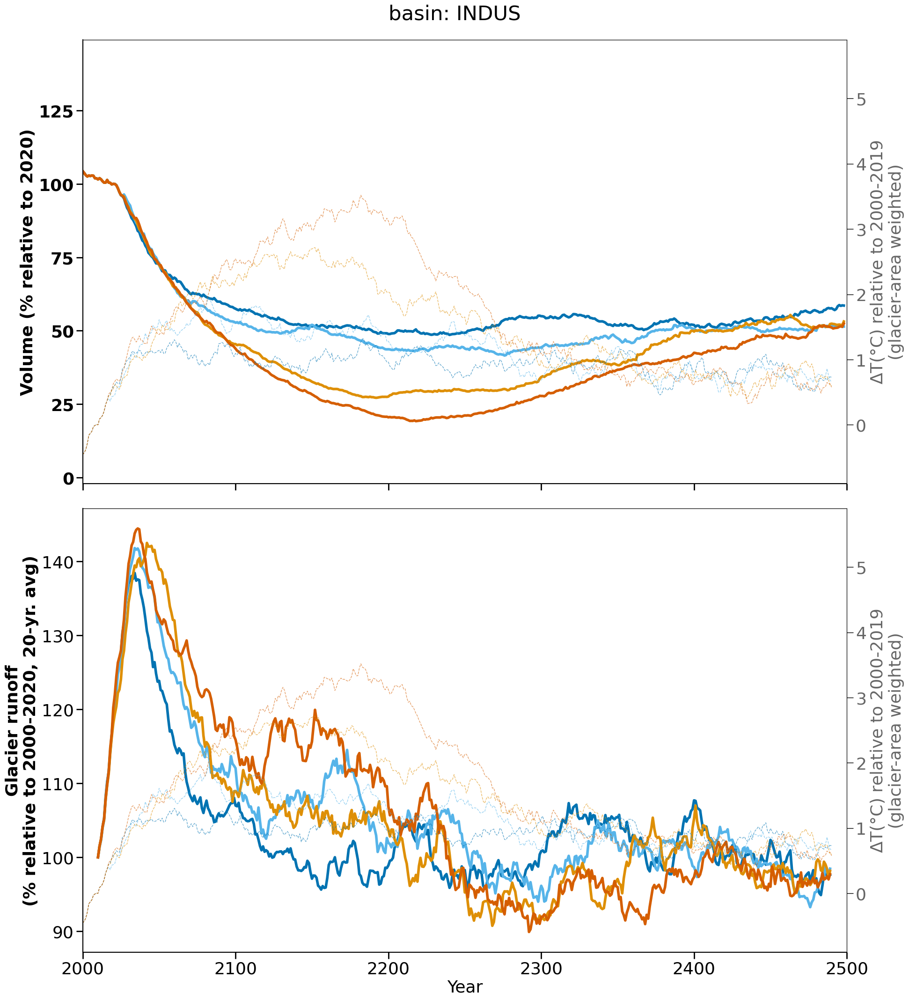

In [297]:
basin = 'INDUS'
import geopandas as gpd
pd_basin_num = gpd.read_file('/home/www/fmaussion/misc/magicc/basins_shape/glacier_basins.shp')
basin_idx = pd_basin_num[pd_basin_num['RIVER_BASI'] == basin]['MRBID'].values[0]

dir_path = '/home/www/lschuster/provide/gfdl-esm2m_oversh_stab_uni_bern/runs/output/basins/'
file = f'w5e5_gcm_merged_from_2000_bc_2000_2019/{basin_idx}/basin_{basin_idx}_run_hydro_w5e5_gcm_merged_from_2000_endyr2500_bc_2000_2019.nc'
with xr.open_dataset(dir_path+file) as dr:
    dr = dr[['runoff','volume']].load()
    dr = dr.isel(time=slice(0,-1))
    # only want common running RGIs
    dr = dr.dropna(dim='rgi_id',how='any')
    dr = dr.sum(dim='rgi_id')
dr['runoff_50_yr_avg'] = dr.runoff.rolling(min_periods=50, time=50, center=True).mean()
dr['runoff_20_yr_avg'] = dr.runoff.rolling(min_periods=20, time=20, center=True).mean()


bc = 'bc_2000_2019' #'bc_1980_2019'
plt.rc('font', size=26)

pd_vol_scenario_rel = (100*dr/dr.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
pd_runoff_scenario_rel = (100*dr/dr.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()
pd_runoff_scenario_rel_20yravg = (100*dr/dr.sel(time=2010)).runoff_20_yr_avg.to_dataframe('runoff_rel_2000_2020_%').reset_index()

fig, axs = plt.subplots(2,1, figsize=(20,22), sharex=True)
#####################
ax = axs[0]

plt.suptitle(f'basin: {basin}')
ax.set_ylabel('Volume (% relative to 2020)', weight='bold')
scenarios = ['stab_T15', 'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']
sns.lineplot(data=pd_vol_scenario_rel.loc[pd_vol_scenario_rel.bias_correction==bc],
             hue='scenario', x='time', y= 'volume_rel_2020_%', 
             palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_ylim([-2,149]);
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in ['stab_T15',
                 'oversh_T20OS15',
                 'oversh_T25OS15',
                 'oversh_T30OS15']:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin_idx}_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 0.6, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
ax2.set_ylim([-0.9,5.9]);
#plt.setp(ax2.get_yticklabels(), visible=False)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                      alpha = 0.6)

ax = axs[1]
ax.set_ylabel('Glacier runoff\n(% relative to 2000-2020, 20-yr. avg)', weight='bold')
scenarios = ['stab_T15', 'oversh_T20OS15',
                     'oversh_T25OS15',
                     'oversh_T30OS15']
sns.lineplot(data=pd_runoff_scenario_rel_20yravg.loc[pd_runoff_scenario_rel_20yravg.bias_correction==bc],
             hue='scenario', x='time', y= 'runoff_rel_2000_2020_%', 
             palette=list(color_scenario.values())[:-1],
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
#ax.set_ylim([85,135]);
#ax.set_yticks(ticks=[0,25,50,75,100,125],
#                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in ['stab_T15',
                 'oversh_T20OS15',
                 'oversh_T25OS15',
                 'oversh_T30OS15']:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin_idx}_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 0.6, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
ax2.set_ylim([-0.9,5.9]);
#plt.setp(ax2.get_yticklabels(), visible=False)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                      alpha = 0.6)
ax.set_xlabel('Year')
plt.tight_layout()
plt.savefig(f'test_{basin}.pdf')

In [274]:
pd_clim_scenario.regi

,temp,temp_20yr_avg,precip,precip_20yr_avg,region,scenario,year
32823,287.629999,NaN,1090.520351,NaN,global,oversh_T30OS15,1979
32824,287.697952,NaN,1097.156112,NaN,global,oversh_T30OS15,1980
32825,287.467248,NaN,1088.562243,NaN,global,oversh_T30OS15,1981
32826,287.449083,NaN,1088.729391,NaN,global,oversh_T30OS15,1982
32827,287.301079,NaN,1081.871293,NaN,global,oversh_T30OS15,1983
...,...,...,...,...,...,...,...
271957,273.492279,NaN,659.969482,NaN,basin_6255_glacier,oversh_T30OS15,2495
271958,273.019745,NaN,763.234436,NaN,basin_6255_glacier,oversh_T30OS15,2496
271959,272.945679,NaN,748.588745,NaN,basin_6255_glacier,oversh_T30OS15,2497
271960,273.898376,NaN,868.870605,NaN,basin_6255_glacier,oversh_T30OS15,2498


In [ ]:
plt.figure(figsize=(12,8))
j=1
for _gcm in ['MRI-ESM2-0','CESM2-WACCM']:
    pd_temp_weight = pd_temp_weight_d[_gcm]
    ds_sum = ds_sum_d[_gcm]
    plt.subplot(2,2,j)

    #pd_temp_weight = pd_temp_weight.loc[2010:]
    plt.plot(pd_temp_weight.index, 
             pd_temp_weight.temp_change, color='C3', lw=3)
    plt.ylabel('Basin temperature change\n(glacier-area weighted)', color='C3', weight='bold')
    plt.xlabel('Year')
    plt.gca().set_ylim([0.4,3.49])
    ax2 = plt.gca().twinx()
    ax2.plot(ds_sum.time, ds_sum.volume/1e9, color='C0', lw=3)
    ax2.set_ylabel('Total basin glacier volume (km³)', color='C0', weight='bold')
    ax2.set_ylim([1000,2400])

    plt.xticks(np.arange(2000,2301,50));
    plt.title(f'{_gcm}')
    

    plt.subplot(2,2,j+2, sharex=ax2)

    #pd_temp_weight = pd_temp_weight.loc[2010:]
    plt.plot(pd_temp_weight.index, 
             pd_temp_weight.temp_change, color='C3', lw=3)
    plt.ylabel('Basin temperature change\n(glacier-area weighted)', color='C3', weight='bold')
    plt.xlabel('Year')
    plt.gca().set_ylim([0.4,3.49])

    ax2 = plt.gca().twinx()
    ax2.plot(ds_sum.time.sel(time=slice(2010,2300)),
             ds_sum.runoff.sel(time=slice(2010,2300))/1e9, color='darkblue', lw=3)
    ax2.set_ylabel('Runoff from glacierized areas\n(MT yr-1)', color='darkblue', weight='bold')
    plt.xticks(np.arange(2000,2301,50));
    ax2.set_ylim([31000,70000])

    j+=1


plt.tight_layout()
plt.savefig(f'temperature_volume_runoff_indus_example.png', tight_layout=True)